In [1]:
import cv2 
from DataLoader import load_gaps_cut
import numpy as np 

E:\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


sys.version_info(major=3, minor=6, micro=5, releaselevel='final', serial=0)


In [2]:
import os
from gaps_dataset import gaps 

In [3]:
destination_directory = './'
ref_filename = os.path.join(destination_directory, 'images/patch_references_train.npy')
patch_ref = np.load(ref_filename).astype(int)
n_patches = patch_ref.shape[0] # number of patches
image_template = os.path.join(destination_directory, 'images/images/train_{:04d}.jpg')

In [18]:
image_cut = 'images/cut_image/train_{:04d}.jpg_{:d}_{:d}.jpg'
dist_image_cut = 'images/cut_crack_image/train_{:04d}.jpg_{:d}_{:d}.jpg'
for i in range(1418):
    file_name = image_template.format(i)
    idx = np.where(patch_ref[:,0] == i)
    for index in idx[0]:
        image_index, row, col, mirror_state, binary_label, class_label = patch_ref[index]
        if binary_label == 1:
            block_x = int(col / 240)
            block_y = int(row / 216)
            image = image_cut.format(i,block_y, block_x)
            image_dist = dist_image_cut.format(i,block_y, block_x)
            if not os.path.exists(image_dist):
                os.rename(image, image_dist)

In [16]:
# read all images and save them to a npy file for read
im_data = []
for f in os.listdir('images/cut_crack_image/'):
    image = cv2.imread('images/cut_crack_image/' + f, cv2.IMREAD_GRAYSCALE)
    image = image.astype(np.float32)
    image /= 255
    im_data.append(image)
im_data = np.asarray(im_data)
im_data = np.reshape(im_data, (7266, 216, 240, 1))
np.save('cut_crack_image.npy', im_data)

In [27]:
# todo: 准备PASCAL的数据文件
image_cut = 'images/cut_image/train_{:04d}.jpg_{:d}_{:d}.jpg'
dist_image_cut = 'images/cut_crack_image/train_{:04d}.jpg_{:d}_{:d}.jpg'
# for i in range(1418):

block_id = "%d,%d"

i = 1
idx = np.where(patch_ref[:,0]==i)

block_x_min = dict()
block_y_min = dict()

block_x_max = dict()
block_y_max = dict()

for index in idx[0]:
    image_index, row, col, mirror_state, binary_label, class_label = patch_ref[index]
    if binary_label == 1:
        block_x = int(col / 240)
        block_y = int(row / 216)
        if block_x_min.get(block_id % (block_y,block_x)) is not None:
            if row < block_x_min[block_id % (block_y,block_x)]:
                block_x_min[block_id % (block_y,block_x)] = row - block_y * 216
        else:
            block_x_min[block_id % (block_y,block_x)] = row - block_y * 216
            
        if block_x_max.get(block_id % (block_y,block_x)) is not None:
            if row > block_x_max[block_id % (block_y,block_x)]:
                block_x_max[block_id % (block_y,block_x)] = row - block_y * 216
        else:
            block_x_max[block_id % (block_y,block_x)] = row - block_y * 64

        if block_y_min.get(block_id % (block_y,block_x)) is not None:
            if col < block_y_min[block_id % (block_y,block_x)]:
                block_y_min[block_id % (block_y,block_x)] = col
        else:
            block_y_min[block_id % (block_y,block_x)] = col
            
        if block_y_max.get(block_id % (block_y,block_x)) is not None:
            if col > block_y_max

print(block_x_min)
print(block_x_max)
print(block_y_min)

{'4,2': 47, '3,1': 2, '0,2': 211, '0,3': 211, '4,1': 51, '3,0': 0, '4,3': 47}
{'4,2': 47, '3,1': 0, '0,2': 211, '0,3': 211, '4,1': 51, '3,0': 0, '4,3': 47}
{'4,2': 547, '3,1': 240, '0,2': 618, '0,3': 720, '4,1': 267, '3,0': 224, '4,3': 721}


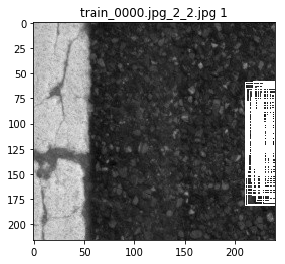

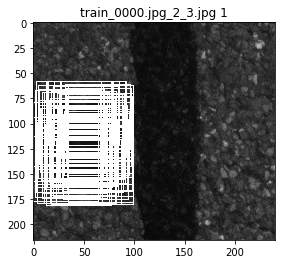

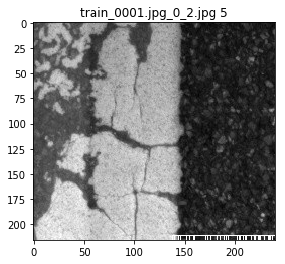

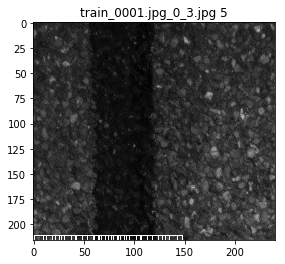

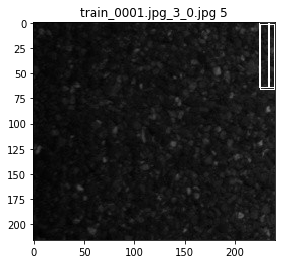

...

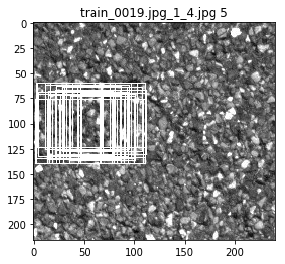

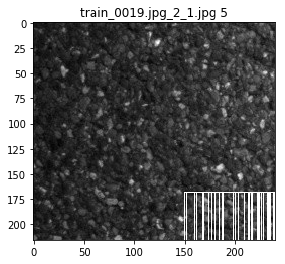

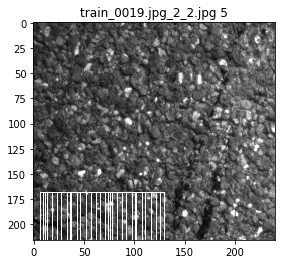

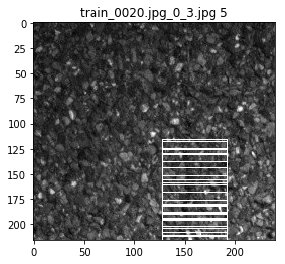

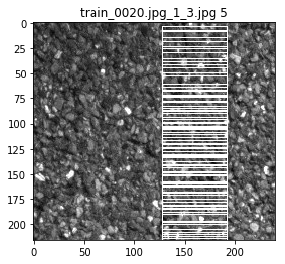

In [45]:
import re
import operator
from matplotlib import pyplot as plt
for f,_ in zip(os.listdir('images/cut_crack_image/'),range(100)):
    block_y = re.search("_[0-9]{1}_",f).group(0)
    block_y = re.sub('_','',block_y,1)
    block_y = re.subn('_','',block_y,1)
    block_y = int(block_y[0])
    block_x = re.search("_[0-9]{1}[.]jpg",f).group(0)
    block_x = re.sub('_','',block_x,1)
    block_x = re.subn('.jpg','',block_x,1)
    block_x = int(block_x[0])
    image_id = re.search("train_[0-9]{4}",f).group(0)
    image_id = re.sub('train_', '', image_id)
    image_id = int(image_id)
    idx = np.where(patch_ref[:,0]==image_id)[0]
    data = patch_ref[idx]
    lines = []
    for line in data:
        if line[4] == 1 and  block_y * 216 <= line[1] <= (block_y + 1) * 216 and block_x * 240 <= line[2] <= (block_x + 1) * 240:
            lines.append(line)
    lines = np.asarray(lines)
    row = lines[:,1:3]
    row = sorted(row, key=operator.itemgetter(0,1))
    image = cv2.imread('images/cut_crack_image/'+f,cv2.IMREAD_GRAYSCALE)
    for line in row :
        image = cv2.rectangle(image, (line[1]-(block_x * 240),line[0]-(block_y*216)), (line[1]+64-(block_x*240),line[0]+64-(block_y*216)),255)
    plt.title(f + " "+str(lines[0][5]))
    plt.imshow(image,cmap='gray')
    plt.show()